In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [4]:

!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments


Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1416, done.
remote: Counting objects: 100% (189/189), done.
remote: Compressing objects: 100% (128/128), done.
remote: Total 1416 (delta 126), reused 117 (delta 60), pack-reused 1227
Receiving objects: 100% (1416/1416), 57.48 MiB | 14.13 MiB/s, done.
Resolving deltas: 100% (1010/1010), done.


In [5]:
import torch
torch.backends.cudnn.benchmark = True

In [6]:

from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_ExamplesIntercept import make_lm_program_ig_intercept, make_lm_program_ig_intercept_batched

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.Transformer_CNF import TransformerCNFConditionalDecoder
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist

from PFNExperiments.Training.FlowMatching.CFMLossOT2 import CFMLossOT2

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.Training.FlowMatching.Couplings import MiniBatchOTCoupling

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured
from PFNExperiments.Evaluation.Evaluate import Evaluate


In [7]:
N = 50
P = 5
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_intercept_v1"

#BATCH_SIZE = 128

In [8]:
a = 5.0
b = 2.0
tau = 1.0
tau_beta0 = 3.0

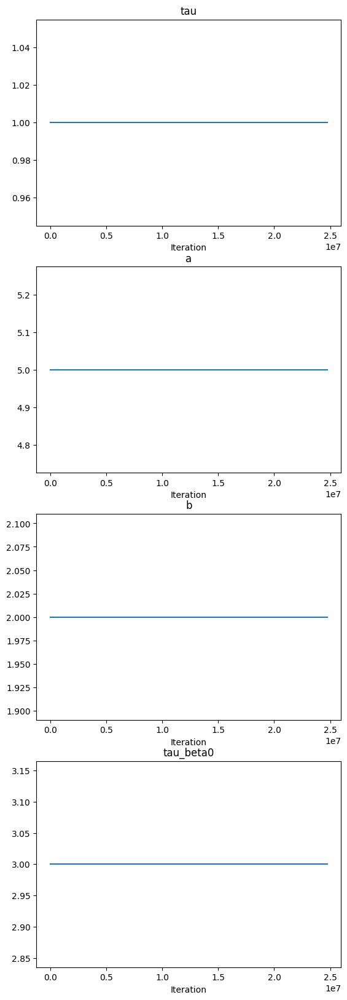

In [9]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),
    ("tau_beta0", curriculum.constant_scheduler(tau_beta0)),

    ]
)
curriculum.plot_all_schedules()

In [10]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0}

In [11]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_intercept_batched,
    curriculum= curriculum,
)

In [12]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic()[0])).keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'beta0', 'time', 'base_sample_beta'])

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 68.57it/s]


{'X': {'mean': tensor(0.5001), 'variance': tensor(0.0832), 'min': tensor(5.9605e-08), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.0025), 'variance': tensor(10.9737), 'min': tensor(-16.7984), 'max': tensor(14.5971)}, 'beta': {'mean': tensor([ 0.0027,  0.0036,  0.0106, -0.0003, -0.0199, -0.0016]), 'variance': tensor([9.0460, 1.0362, 0.9574, 0.9880, 0.9874, 0.9837]), 'min': tensor([-12.4370,  -3.6647,  -3.2346,  -3.6101,  -3.2116,  -3.6155]), 'max': tensor([10.9191,  3.2689,  3.0174,  3.1542,  3.4225,  3.8283])}}
Statistics for sigma_squared:
Mean: tensor([0.5018])
Variance: tensor([0.0747])
Min: tensor([0.1296])
Max: tensor([2.8285])


Statistics for beta0:
Mean: tensor([0.0027])
Variance: tensor([9.0460])
Min: tensor([-12.4370])
Max: tensor([10.9191])


Statistics for time:
Mean: 0.497775017330423
Variance: 0.0820004548983714
Min: 0.00020676851272583008
Max: 0.9983711838722229


Statistics for base_sample_beta:
Mean: tensor([ 0.0084,  0.0304,  0.0095, -0.0061, -0.0102, -0.0142])
Var

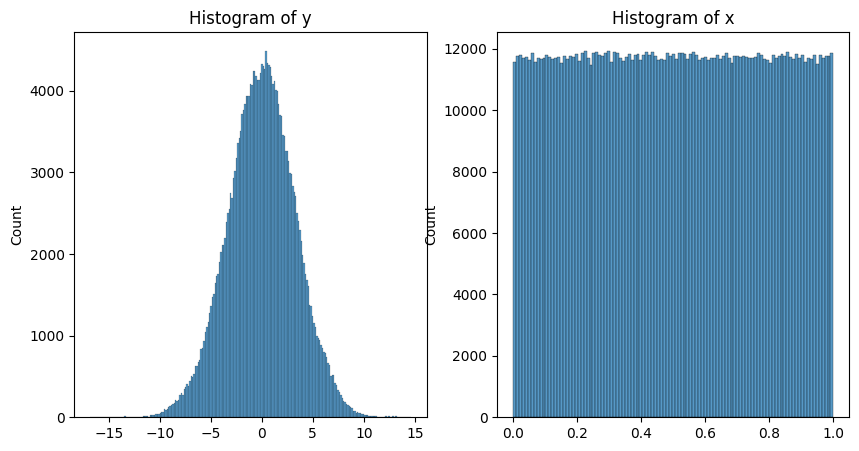

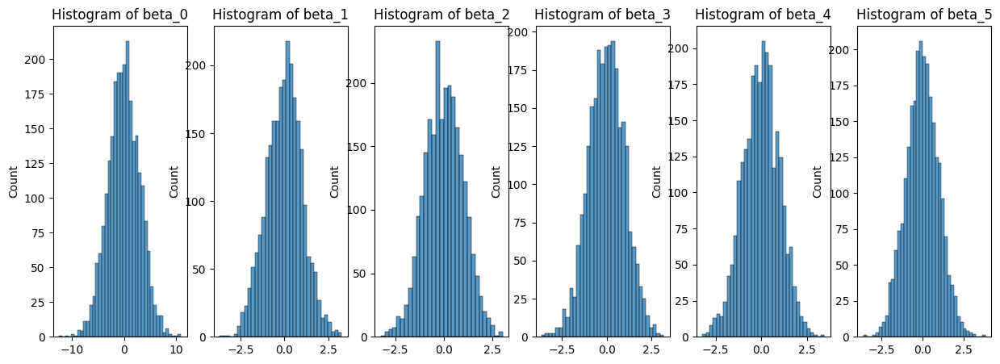

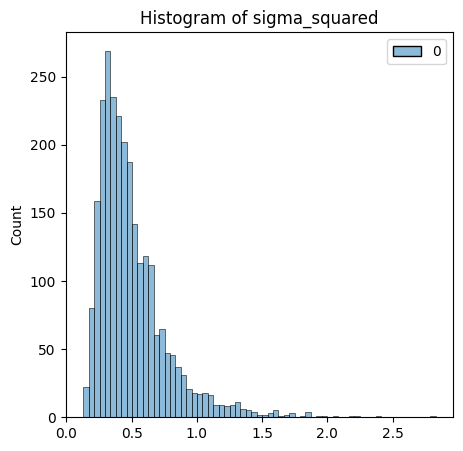

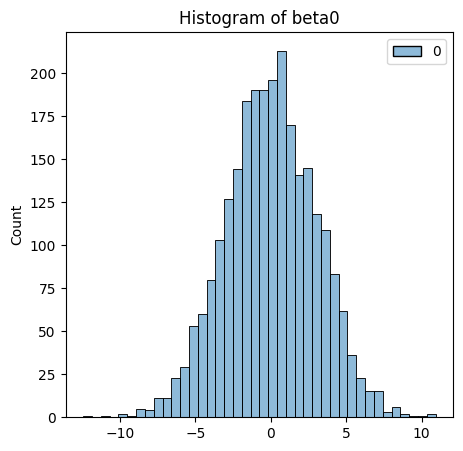

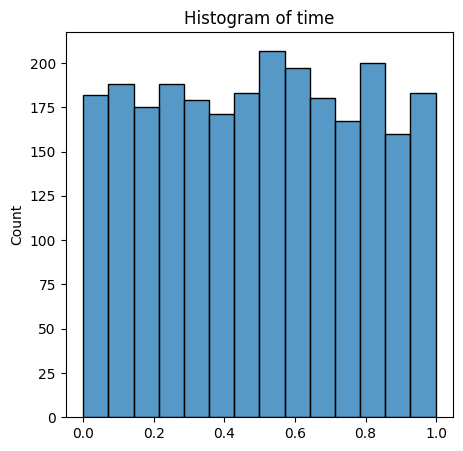

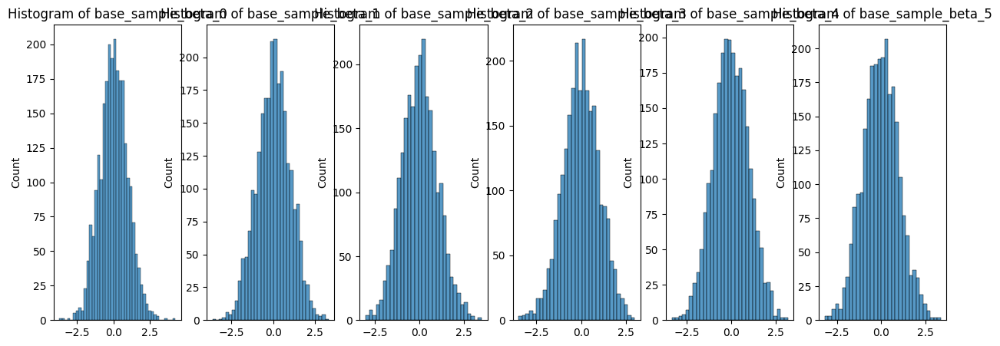

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 69.40it/s]

{'X': {'mean': tensor(0.4998), 'variance': tensor(0.0833), 'min': tensor(1.8477e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(-0.0011), 'variance': tensor(11.0362), 'min': tensor(-14.5648), 'max': tensor(12.5557)}, 'beta': {'mean': tensor([-0.0063,  0.0090,  0.0058, -0.0176,  0.0348, -0.0196]), 'variance': tensor([8.9721, 1.0095, 1.0118, 1.0038, 1.0256, 0.9827]), 'min': tensor([-10.6851,  -3.3100,  -3.4244,  -3.2221,  -3.0803,  -3.8966]), 'max': tensor([10.5508,  3.6280,  3.3447,  3.7500,  4.3634,  3.5669])}}
Statistics for sigma_squared:
Mean: tensor([0.5040])
Variance: tensor([0.0801])
Min: tensor([0.1163])
Max: tensor([3.4390])


Statistics for beta0:
Mean: tensor([-0.0063])
Variance: tensor([8.9721])
Min: tensor([-10.6851])
Max: tensor([10.5508])


Statistics for time:
Mean: 0.5003627577330917
Variance: 0.08443893063190916
Min: 0.0011137127876281738


Max: 0.999271035194397


Statistics for base_sample_beta:
Mean: tensor([-0.0170, -0.0414, -0.0314, -0.0108,  0.0106, -0.0308])
Variance: tensor([0.9994, 1.0503, 1.0145, 1.0202, 1.0084, 1.0161])
Min: tensor([-3.0157, -4.1312, -3.6538, -3.3489, -3.2265, -3.9430])
Max: tensor([3.8077, 3.3471, 3.3024, 4.2118, 4.2326, 3.4025])




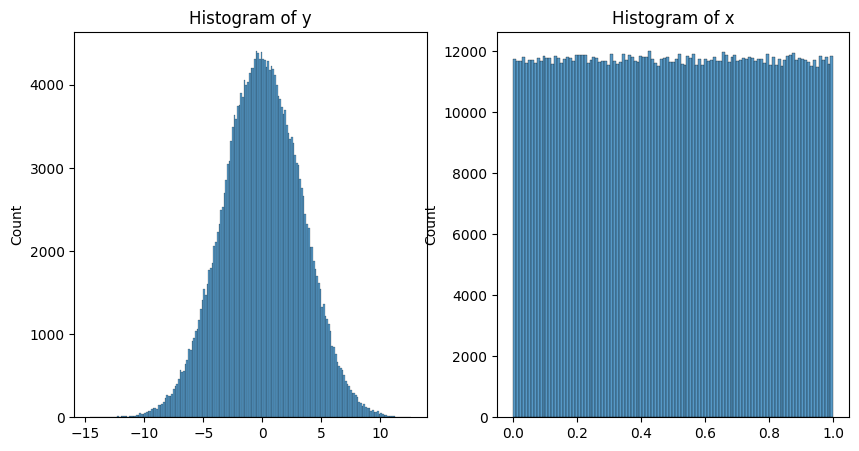

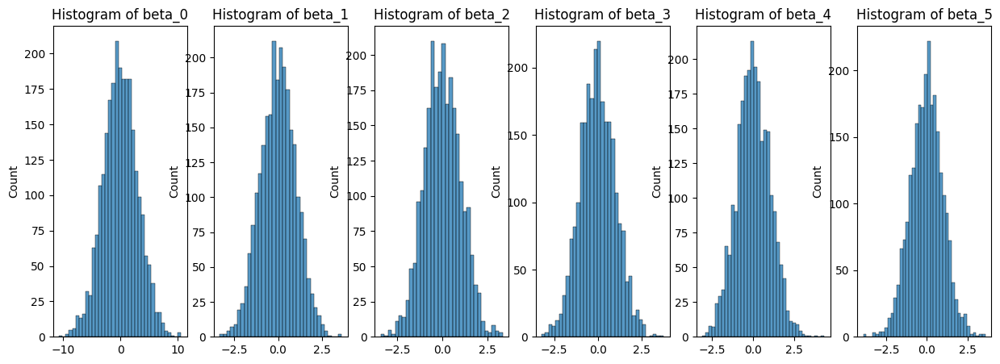

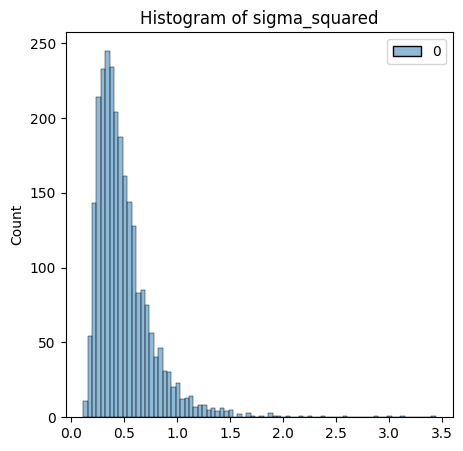

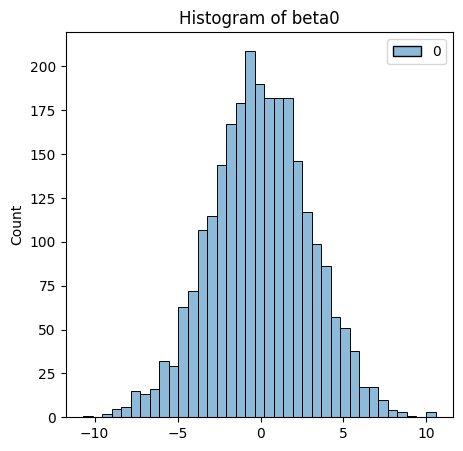

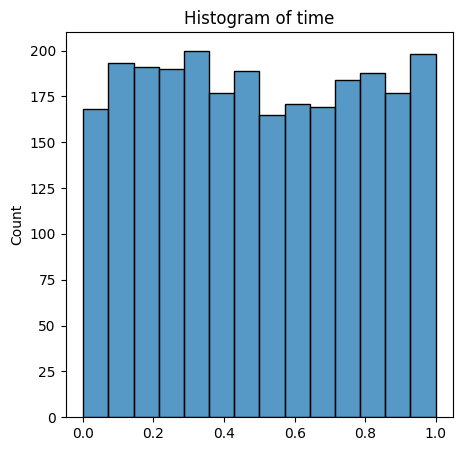

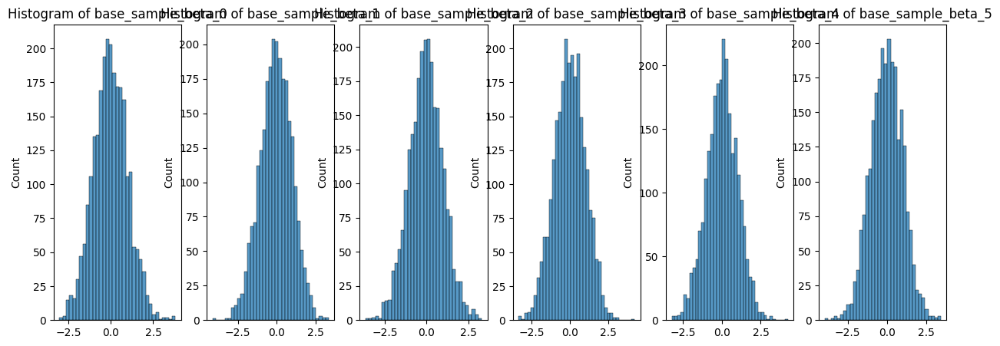

[{'X': {'mean': tensor(0.5001),
   'variance': tensor(0.0832),
   'min': tensor(5.9605e-08),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.0025),
   'variance': tensor(10.9737),
   'min': tensor(-16.7984),
   'max': tensor(14.5971)},
  'beta': {'mean': tensor([ 0.0027,  0.0036,  0.0106, -0.0003, -0.0199, -0.0016]),
   'variance': tensor([9.0460, 1.0362, 0.9574, 0.9880, 0.9874, 0.9837]),
   'min': tensor([-12.4370,  -3.6647,  -3.2346,  -3.6101,  -3.2116,  -3.6155]),
   'max': tensor([10.9191,  3.2689,  3.0174,  3.1542,  3.4225,  3.8283])}},
 {'X': {'mean': tensor(0.4998),
   'variance': tensor(0.0833),
   'min': tensor(1.8477e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(-0.0011),
   'variance': tensor(11.0362),
   'min': tensor(-14.5648),
   'max': tensor(12.5557)},
  'beta': {'mean': tensor([-0.0063,  0.0090,  0.0058, -0.0176,  0.0348, -0.0196]),
   'variance': tensor([8.9721, 1.0095, 1.0118, 1.0038, 1.0256, 0.9827]),
   'min': tensor([-10.6851,  -3.3100,  -3.4244,  -

In [13]:

data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

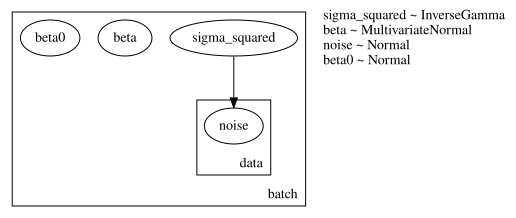

In [14]:
data_generator.render_model()

In [15]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [16]:
sample_batch = next(iter(epoch_loader[0][0]))

In [17]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'beta0', 'time', 'base_sample_beta'])

In [18]:

model = TransformerCNFConditionalDecoder(
    n_input_features_encoder = P+1,
    n_input_features_decoder = P+1,
    d_model_encoder = 512,
    d_model_decoder = 512,
    n_heads_encoder = 8,
    n_heads_decoder = 8,
    d_ff_encoder = 1024,
    d_ff_decoder = 1024,
    dropout_encoder = 0.1,
    dropout_decoder = 0.1,
    n_conditional_input_features =  1,
    n_condition_features = 512,
    n_layers_condition_embedding = 3,
    n_layers_encoder = 8,
    n_layers_decoder = 6,
    use_positional_encoding_encoder = True,
    use_positional_encoding_decoder = False,
    use_self_attention_decoder = False,
    output_dim = P+1,
    d_final_processing = 512,
    n_final_layers = 3,
    dropout_final = 0.1,
    treat_z_as_sequence = False,
)

In [19]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [20]:
'{:.2e}'.format(count_parameters(model))

'4.31e+07'

In [21]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [22]:
lr = 1e-6
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [23]:
loss_fun = CFMLossOT2(
    sigma_min=1e-2
)

In [24]:
scheduler = OneCycleLR(opt,
                       max_lr = 5e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e4)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [25]:
#?TrainerCurriculumCNF

In [26]:
trainer = TrainerCurriculumCNF(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    coupling = None,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    max_gradient_norm = 1.0

)

In [27]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_05_14_40_10")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_05_14_40_10'

In [28]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

In [29]:
trainer.validate()

100%|██████████| 49/49 [00:20<00:00,  2.37it/s]


{'loss_mean': 0.3751318156719208,
 'loss_median': 0.3749701976776123,
 'loss_std': 0.011292535811662674}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 0


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 0:
Training: {'loss_mean': 3.441023111343384, 'loss_median': 3.4360711574554443, 'loss_std': 0.09588492661714554}
Validation: {'loss_mean': 3.3404974937438965, 'loss_median': 3.317474365234375, 'loss_std': 0.09788932651281357}
Validation curriculum: {'loss_mean': 3.328104019165039, 'loss_median': 3.3350844383239746, 'loss_std': 0.07226183265447617}
Time: 367.04927492141724
Learning rate: [2.2956007119594385e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 249856


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 1:
Training: {'loss_mean': 3.2506356239318848, 'loss_median': 3.2832820415496826, 'loss_std': 0.15956376492977142}
Validation: {'loss_mean': 2.729008913040161, 'loss_median': 2.716142177581787, 'loss_std': 0.06518632918596268}
Validation curriculum: {'loss_mean': 2.71928071975708, 'loss_median': 2.721301794052124, 'loss_std': 0.06825555115938187}
Time: 367.13613653182983
Learning rate: [3.175121199428514e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 499712


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 2:
Training: {'loss_mean': 2.3741183280944824, 'loss_median': 2.3084850311279297, 'loss_std': 0.24223127961158752}
Validation: {'loss_mean': 1.9767026901245117, 'loss_median': 1.9756112098693848, 'loss_std': 0.04154915362596512}
Validation curriculum: {'loss_mean': 1.9742796421051025, 'loss_median': 1.970659613609314, 'loss_std': 0.03701387718319893}
Time: 366.75041675567627
Learning rate: [4.616895888883983e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 749568


100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


Epoch 3:
Training: {'loss_mean': 1.9701122045516968, 'loss_median': 1.9698808193206787, 'loss_std': 0.07449573278427124}
Validation: {'loss_mean': 1.9150348901748657, 'loss_median': 1.91617751121521, 'loss_std': 0.03843218460679054}
Validation curriculum: {'loss_mean': 1.9278159141540527, 'loss_median': 1.9274508953094482, 'loss_std': 0.03737245127558708}
Time: 366.87318897247314
Learning rate: [6.58540897826852e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 999424


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 4:
Training: {'loss_mean': 1.853537917137146, 'loss_median': 1.853354811668396, 'loss_std': 0.03679990768432617}
Validation: {'loss_mean': 1.9160233736038208, 'loss_median': 1.9196799993515015, 'loss_std': 0.0335376113653183}
Validation curriculum: {'loss_mean': 1.908090353012085, 'loss_median': 1.9134738445281982, 'loss_std': 0.037606872618198395}
Time: 367.3958842754364
Learning rate: [9.032169311688483e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1249280


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 5:
Training: {'loss_mean': 1.823857069015503, 'loss_median': 1.825744390487671, 'loss_std': 0.038140445947647095}
Validation: {'loss_mean': 1.7834930419921875, 'loss_median': 1.7831439971923828, 'loss_std': 0.03295218199491501}
Validation curriculum: {'loss_mean': 1.7876386642456055, 'loss_median': 1.7897008657455444, 'loss_std': 0.034077227115631104}
Time: 367.42864060401917
Learning rate: [0.0001189690488109779]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1499136


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 6:
Training: {'loss_mean': 1.7401740550994873, 'loss_median': 1.7643115520477295, 'loss_std': 0.09043966978788376}
Validation: {'loss_mean': 1.7779793739318848, 'loss_median': 1.7783286571502686, 'loss_std': 0.0437898188829422}
Validation curriculum: {'loss_mean': 1.7671213150024414, 'loss_median': 1.7691062688827515, 'loss_std': 0.041264887899160385}
Time: 365.8122742176056
Learning rate: [0.00015109047530338697]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1748992


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 7:
Training: {'loss_mean': 1.5706104040145874, 'loss_median': 1.5696322917938232, 'loss_std': 0.04036015644669533}
Validation: {'loss_mean': 1.496059536933899, 'loss_median': 1.5015442371368408, 'loss_std': 0.031236354261636734}
Validation curriculum: {'loss_mean': 1.506204605102539, 'loss_median': 1.5030096769332886, 'loss_std': 0.031372349709272385}
Time: 365.52435421943665
Learning rate: [0.00018589471288241952]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 1998848


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 8:
Training: {'loss_mean': 1.3944205045700073, 'loss_median': 1.367107629776001, 'loss_std': 0.1014057993888855}
Validation: {'loss_mean': 1.2467975616455078, 'loss_median': 1.2433428764343262, 'loss_std': 0.03235258162021637}
Validation curriculum: {'loss_mean': 1.2430428266525269, 'loss_median': 1.2404431104660034, 'loss_std': 0.028585433959960938}
Time: 364.6980459690094
Learning rate: [0.00022252441509744512]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2248704


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 9:
Training: {'loss_mean': 1.1089344024658203, 'loss_median': 1.0993976593017578, 'loss_std': 0.06616899371147156}
Validation: {'loss_mean': 1.0454905033111572, 'loss_median': 1.0441005229949951, 'loss_std': 0.025486009195446968}
Validation curriculum: {'loss_mean': 1.0408873558044434, 'loss_median': 1.0429178476333618, 'loss_std': 0.021860146895051003}
Time: 364.78935384750366
Learning rate: [0.0002600772681106616]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2498560


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 10:
Training: {'loss_mean': 0.9228518009185791, 'loss_median': 0.9001347422599792, 'loss_std': 0.08347172290086746}
Validation: {'loss_mean': 0.9075000286102295, 'loss_median': 0.9087736010551453, 'loss_std': 0.024169543758034706}
Validation curriculum: {'loss_mean': 0.8989912271499634, 'loss_median': 0.8980472087860107, 'loss_std': 0.02233113721013069}
Time: 365.2298126220703
Learning rate: [0.0002976282177481679]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2748416


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 11:
Training: {'loss_mean': 0.8143020868301392, 'loss_median': 0.8133789896965027, 'loss_std': 0.03135883808135986}
Validation: {'loss_mean': 0.7592999339103699, 'loss_median': 0.7600437998771667, 'loss_std': 0.02500927820801735}
Validation curriculum: {'loss_mean': 0.7567830681800842, 'loss_median': 0.7601423263549805, 'loss_std': 0.02033400535583496}
Time: 364.9694347381592
Learning rate: [0.0003342522567226638]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 2998272


100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


Epoch 12:
Training: {'loss_mean': 0.7206709980964661, 'loss_median': 0.7444474101066589, 'loss_std': 0.07791437208652496}
Validation: {'loss_mean': 0.5740121006965637, 'loss_median': 0.5704443454742432, 'loss_std': 0.017263535410165787}
Validation curriculum: {'loss_mean': 0.5734845399856567, 'loss_median': 0.5754761695861816, 'loss_std': 0.02095816656947136}
Time: 364.09566283226013
Learning rate: [0.0003690472107011752]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3248128


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 13:
Training: {'loss_mean': 0.561994731426239, 'loss_median': 0.5583111643791199, 'loss_std': 0.030712803825736046}
Validation: {'loss_mean': 0.5375807881355286, 'loss_median': 0.5359528064727783, 'loss_std': 0.015771791338920593}
Validation curriculum: {'loss_mean': 0.532835841178894, 'loss_median': 0.532863974571228, 'loss_std': 0.01824958063662052}
Time: 363.75960779190063
Learning rate: [0.0004011559619196486]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3497984


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 14:
Training: {'loss_mean': 0.5405620336532593, 'loss_median': 0.5373009443283081, 'loss_std': 0.024116214364767075}
Validation: {'loss_mean': 0.5515398979187012, 'loss_median': 0.5490931272506714, 'loss_std': 0.021521946415305138}
Validation curriculum: {'loss_mean': 0.5499026775360107, 'loss_median': 0.5498440265655518, 'loss_std': 0.021720770746469498}
Time: 363.27787256240845
Learning rate: [0.00042978756290139113]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3747840


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 15:
Training: {'loss_mean': 0.5268396735191345, 'loss_median': 0.5235658884048462, 'loss_std': 0.02429088018834591}
Validation: {'loss_mean': 0.5413426756858826, 'loss_median': 0.5394481420516968, 'loss_std': 0.015677623450756073}
Validation curriculum: {'loss_mean': 0.5420933961868286, 'loss_median': 0.5454478859901428, 'loss_std': 0.017270516604185104}
Time: 362.776921749115
Learning rate: [0.0004542367201768414]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 3997696


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 16:
Training: {'loss_mean': 0.5255975723266602, 'loss_median': 0.5206254720687866, 'loss_std': 0.02720978669822216}
Validation: {'loss_mean': 0.5354233384132385, 'loss_median': 0.5358540415763855, 'loss_std': 0.014846133068203926}
Validation curriculum: {'loss_mean': 0.5358827710151672, 'loss_median': 0.5378021001815796, 'loss_std': 0.012437515892088413}
Time: 363.66288900375366
Learning rate: [0.0004739011680545465]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4247552


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 17:
Training: {'loss_mean': 0.5198891758918762, 'loss_median': 0.5180730819702148, 'loss_std': 0.029409397393465042}
Validation: {'loss_mean': 0.47923544049263, 'loss_median': 0.47630688548088074, 'loss_std': 0.019115759059786797}
Validation curriculum: {'loss_mean': 0.47326308488845825, 'loss_median': 0.47072646021842957, 'loss_std': 0.01613765023648739}
Time: 363.2252027988434
Learning rate: [0.0004882965044684283]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4497408


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 18:
Training: {'loss_mean': 0.5066648125648499, 'loss_median': 0.501811683177948, 'loss_std': 0.02532268688082695}
Validation: {'loss_mean': 0.493908554315567, 'loss_median': 0.4921848177909851, 'loss_std': 0.015939004719257355}
Validation curriculum: {'loss_mean': 0.5003268718719482, 'loss_median': 0.5008496046066284, 'loss_std': 0.016920872032642365}
Time: 362.11586117744446
Learning rate: [0.0004970681234440837]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4747264


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 19:
Training: {'loss_mean': 0.5064529180526733, 'loss_median': 0.504524290561676, 'loss_std': 0.024728139862418175}
Validation: {'loss_mean': 0.4770134389400482, 'loss_median': 0.47630399465560913, 'loss_std': 0.017402278259396553}
Validation curriculum: {'loss_mean': 0.47588348388671875, 'loss_median': 0.4753957688808441, 'loss_std': 0.013459126465022564}
Time: 362.1501717567444
Learning rate: [0.000499999999360437]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 4997120


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 20:
Training: {'loss_mean': 0.4989473521709442, 'loss_median': 0.49592405557632446, 'loss_std': 0.0239398330450058}
Validation: {'loss_mean': 0.5127959251403809, 'loss_median': 0.5088304281234741, 'loss_std': 0.01764678582549095}
Validation curriculum: {'loss_mean': 0.5079509019851685, 'loss_median': 0.5067189931869507, 'loss_std': 0.018705451861023903}
Time: 361.9091384410858
Learning rate: [0.0004999616112110189]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5246976


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 21:
Training: {'loss_mean': 0.4915977716445923, 'loss_median': 0.486361563205719, 'loss_std': 0.024485178291797638}
Validation: {'loss_mean': 0.49664419889450073, 'loss_median': 0.495097815990448, 'loss_std': 0.019499067217111588}
Validation curriculum: {'loss_mean': 0.4988973140716553, 'loss_median': 0.49902772903442383, 'loss_std': 0.01898888871073723}
Time: 362.0878326892853
Learning rate: [0.0004998470826380032]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5496832


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 22:
Training: {'loss_mean': 0.4839910864830017, 'loss_median': 0.48245152831077576, 'loss_std': 0.022365866228938103}
Validation: {'loss_mean': 0.4637758731842041, 'loss_median': 0.4617869257926941, 'loss_std': 0.017269788309931755}
Validation curriculum: {'loss_mean': 0.4610370993614197, 'loss_median': 0.46153467893600464, 'loss_std': 0.01528297457844019}
Time: 362.5309307575226
Learning rate: [0.0004996564485279027]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5746688


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 23:
Training: {'loss_mean': 0.4835277795791626, 'loss_median': 0.48111242055892944, 'loss_std': 0.023615695536136627}
Validation: {'loss_mean': 0.45391836762428284, 'loss_median': 0.45328792929649353, 'loss_std': 0.01577720232307911}
Validation curriculum: {'loss_mean': 0.4549645483493805, 'loss_median': 0.4539995789527893, 'loss_std': 0.01607692241668701}
Time: 362.5539026260376
Learning rate: [0.0004993897669497137]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 5996544


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 24:
Training: {'loss_mean': 0.47930455207824707, 'loss_median': 0.4770960211753845, 'loss_std': 0.023233210667967796}
Validation: {'loss_mean': 0.5697012543678284, 'loss_median': 0.5701985955238342, 'loss_std': 0.015068376436829567}
Validation curriculum: {'loss_mean': 0.5697066783905029, 'loss_median': 0.5699690580368042, 'loss_std': 0.016005374491214752}
Time: 361.98582434654236
Learning rate: [0.0004990471191372288]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6246400


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 25:
Training: {'loss_mean': 0.47599083185195923, 'loss_median': 0.47189363837242126, 'loss_std': 0.023699015378952026}
Validation: {'loss_mean': 0.43545010685920715, 'loss_median': 0.43233105540275574, 'loss_std': 0.019062727689743042}
Validation curriculum: {'loss_mean': 0.4359200894832611, 'loss_median': 0.43499335646629333, 'loss_std': 0.018441732972860336}
Time: 361.83625078201294
Learning rate: [0.0004986286094642908]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6496256


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 26:
Training: {'loss_mean': 0.4714187681674957, 'loss_median': 0.4695817828178406, 'loss_std': 0.023569326847791672}
Validation: {'loss_mean': 0.46141111850738525, 'loss_median': 0.4607536494731903, 'loss_std': 0.013319811783730984}
Validation curriculum: {'loss_mean': 0.4609106481075287, 'loss_median': 0.4596704840660095, 'loss_std': 0.01673850789666176}
Time: 361.87616419792175
Learning rate: [0.0004981343654130001]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6746112


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 27:
Training: {'loss_mean': 0.4704466164112091, 'loss_median': 0.4677654206752777, 'loss_std': 0.021938428282737732}
Validation: {'loss_mean': 0.4184662103652954, 'loss_median': 0.41904911398887634, 'loss_std': 0.016688907518982887}
Validation curriculum: {'loss_mean': 0.4182935059070587, 'loss_median': 0.4207150340080261, 'loss_std': 0.01717311702668667}
Time: 362.1394624710083
Learning rate: [0.0004975645375348827]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 6995968


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 28:
Training: {'loss_mean': 0.46821129322052, 'loss_median': 0.46722447872161865, 'loss_std': 0.02200281247496605}
Validation: {'loss_mean': 0.4835972785949707, 'loss_median': 0.4806838035583496, 'loss_std': 0.015955142676830292}
Validation curriculum: {'loss_mean': 0.48708534240722656, 'loss_median': 0.4855654835700989, 'loss_std': 0.015919717028737068}
Time: 362.73666429519653
Learning rate: [0.0004969192994050305]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7245824


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 29:
Training: {'loss_mean': 0.46806836128234863, 'loss_median': 0.46775293350219727, 'loss_std': 0.01965746097266674}
Validation: {'loss_mean': 0.432370126247406, 'loss_median': 0.43032166361808777, 'loss_std': 0.016757577657699585}
Validation curriculum: {'loss_mean': 0.4289458990097046, 'loss_median': 0.42752379179000854, 'loss_std': 0.015355616807937622}
Time: 362.43574476242065
Learning rate: [0.0004961988475692281]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7495680


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 30:
Training: {'loss_mean': 0.4651878774166107, 'loss_median': 0.46068865060806274, 'loss_std': 0.023014774546027184}
Validation: {'loss_mean': 0.43207475543022156, 'loss_median': 0.4333376884460449, 'loss_std': 0.016390835866332054}
Validation curriculum: {'loss_mean': 0.43730980157852173, 'loss_median': 0.4335430860519409, 'loss_std': 0.01553534995764494}
Time: 361.6088237762451
Learning rate: [0.0004954034014840841]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7745536


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 31:
Training: {'loss_mean': 0.46328210830688477, 'loss_median': 0.46015501022338867, 'loss_std': 0.023450490087270737}
Validation: {'loss_mean': 0.42756974697113037, 'loss_median': 0.42940911650657654, 'loss_std': 0.015575449913740158}
Validation curriculum: {'loss_mean': 0.42907121777534485, 'loss_median': 0.4267968535423279, 'loss_std': 0.01573425717651844}
Time: 361.79054141044617
Learning rate: [0.0004945332034501816]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 7995392


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 32:
Training: {'loss_mean': 0.46088600158691406, 'loss_median': 0.4586330056190491, 'loss_std': 0.021793628111481667}
Validation: {'loss_mean': 0.4318806529045105, 'loss_median': 0.43609684705734253, 'loss_std': 0.01741369254887104}
Validation curriculum: {'loss_mean': 0.4294500946998596, 'loss_median': 0.4292648434638977, 'loss_std': 0.015080751851201057}
Time: 361.71081137657166
Learning rate: [0.0004935885185382714]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8245248


100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


Epoch 33:
Training: {'loss_mean': 0.45612722635269165, 'loss_median': 0.4533551335334778, 'loss_std': 0.02132200077176094}
Validation: {'loss_mean': 0.44452041387557983, 'loss_median': 0.442776620388031, 'loss_std': 0.015619179233908653}
Validation curriculum: {'loss_mean': 0.4429517388343811, 'loss_median': 0.4426381289958954, 'loss_std': 0.014843737706542015}
Time: 361.77117824554443
Learning rate: [0.0004925696345085293]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8495104


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 34:
Training: {'loss_mean': 0.45669928193092346, 'loss_median': 0.45498499274253845, 'loss_std': 0.02014208398759365}
Validation: {'loss_mean': 0.49459174275398254, 'loss_median': 0.4931891858577728, 'loss_std': 0.014819353818893433}
Validation curriculum: {'loss_mean': 0.4946969151496887, 'loss_median': 0.4954187870025635, 'loss_std': 0.01766214706003666}
Time: 362.9583411216736
Learning rate: [0.0004914768617229007]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8744960


100%|██████████| 49/49 [00:21<00:00,  2.26it/s]


Epoch 35:
Training: {'loss_mean': 0.4552239775657654, 'loss_median': 0.45429763197898865, 'loss_std': 0.019545767456293106}
Validation: {'loss_mean': 0.42045608162879944, 'loss_median': 0.4243966042995453, 'loss_std': 0.015887640416622162}
Validation curriculum: {'loss_mean': 0.4169115722179413, 'loss_median': 0.4170893132686615, 'loss_std': 0.011805089190602303}
Time: 362.8495318889618
Learning rate: [0.0004903105330505622]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 8994816


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 36:
Training: {'loss_mean': 0.45756667852401733, 'loss_median': 0.45425570011138916, 'loss_std': 0.026580121368169785}
Validation: {'loss_mean': 0.4184437096118927, 'loss_median': 0.4177393913269043, 'loss_std': 0.013962967321276665}
Validation curriculum: {'loss_mean': 0.4167722463607788, 'loss_median': 0.41715630888938904, 'loss_std': 0.014986556954681873}
Time: 361.70165944099426
Learning rate: [0.0004890710037665258]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9244672


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 37:
Training: {'loss_mean': 0.4538598656654358, 'loss_median': 0.4517676532268524, 'loss_std': 0.020094431936740875}
Validation: {'loss_mean': 0.4079252779483795, 'loss_median': 0.4087538421154022, 'loss_std': 0.016983887180685997}
Validation curriculum: {'loss_mean': 0.40772297978401184, 'loss_median': 0.40998372435569763, 'loss_std': 0.015177924185991287}
Time: 361.31800389289856
Learning rate: [0.0004877586514434188]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9494528


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 38:
Training: {'loss_mean': 0.45122453570365906, 'loss_median': 0.4506476819515228, 'loss_std': 0.01886417530477047}
Validation: {'loss_mean': 0.4569171965122223, 'loss_median': 0.4559105634689331, 'loss_std': 0.014780987985432148}
Validation curriculum: {'loss_mean': 0.4601477086544037, 'loss_median': 0.456969678401947, 'loss_std': 0.015032372437417507}
Time: 361.32673168182373
Learning rate: [0.00048637387583647215]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9744384


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 39:
Training: {'loss_mean': 0.45511001348495483, 'loss_median': 0.4527733027935028, 'loss_std': 0.019910940900444984}
Validation: {'loss_mean': 0.4181760549545288, 'loss_median': 0.4185278117656708, 'loss_std': 0.019877873361110687}
Validation curriculum: {'loss_mean': 0.4235149621963501, 'loss_median': 0.4227512776851654, 'loss_std': 0.013244597241282463}
Time: 361.71341156959534
Learning rate: [0.0004849170987617503]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 9994240


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 40:
Training: {'loss_mean': 0.449859082698822, 'loss_median': 0.4481518864631653, 'loss_std': 0.01923425868153572}
Validation: {'loss_mean': 0.41271308064460754, 'loss_median': 0.41332194209098816, 'loss_std': 0.017108045518398285}
Validation curriculum: {'loss_mean': 0.41239476203918457, 'loss_median': 0.4087318778038025, 'loss_std': 0.01510340254753828}
Time: 362.08526825904846
Learning rate: [0.00048338876396766226]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10244096


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 41:
Training: {'loss_mean': 0.45007190108299255, 'loss_median': 0.4479912221431732, 'loss_std': 0.020401716232299805}
Validation: {'loss_mean': 0.4092966318130493, 'loss_median': 0.4090847969055176, 'loss_std': 0.01589161902666092}
Validation curriculum: {'loss_mean': 0.41080668568611145, 'loss_median': 0.40972423553466797, 'loss_std': 0.015377934090793133}
Time: 362.57633447647095
Learning rate: [0.00048178933699979156]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10493952


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 42:
Training: {'loss_mean': 0.45114827156066895, 'loss_median': 0.4496271014213562, 'loss_std': 0.020247355103492737}
Validation: {'loss_mean': 0.4090811312198639, 'loss_median': 0.4108969569206238, 'loss_std': 0.01322811096906662}
Validation curriculum: {'loss_mean': 0.4085049033164978, 'loss_median': 0.40814781188964844, 'loss_std': 0.016221337020397186}
Time: 361.6957881450653
Learning rate: [0.00048011930505908676]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10743808


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 43:
Training: {'loss_mean': 0.44863954186439514, 'loss_median': 0.44423362612724304, 'loss_std': 0.02153978869318962}
Validation: {'loss_mean': 0.4147571325302124, 'loss_median': 0.4153098464012146, 'loss_std': 0.01812533661723137}
Validation curriculum: {'loss_mean': 0.41611406207084656, 'loss_median': 0.4147030711174011, 'loss_std': 0.014959711581468582}
Time: 361.514689207077
Learning rate: [0.00047837917685345486]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 10993664


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 44:
Training: {'loss_mean': 0.4461434781551361, 'loss_median': 0.4458681046962738, 'loss_std': 0.018260160461068153}
Validation: {'loss_mean': 0.4231378138065338, 'loss_median': 0.4212140440940857, 'loss_std': 0.014709491282701492}
Validation curriculum: {'loss_mean': 0.41849809885025024, 'loss_median': 0.41776546835899353, 'loss_std': 0.013334870338439941}
Time: 361.40049147605896
Learning rate: [0.00047656948244280433]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11243520


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 45:
Training: {'loss_mean': 0.4494863450527191, 'loss_median': 0.4478716254234314, 'loss_std': 0.018849169835448265}
Validation: {'loss_mean': 0.4276067912578583, 'loss_median': 0.42951008677482605, 'loss_std': 0.016180705279111862}
Validation curriculum: {'loss_mean': 0.4275844395160675, 'loss_median': 0.426276296377182, 'loss_std': 0.017909830436110497}
Time: 361.3777482509613
Learning rate: [0.0004746907730775835]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11493376


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 46:
Training: {'loss_mean': 0.4449836313724518, 'loss_median': 0.443692147731781, 'loss_std': 0.020989466458559036}
Validation: {'loss_mean': 0.4135752022266388, 'loss_median': 0.4133067727088928, 'loss_std': 0.016162795946002007}
Validation curriculum: {'loss_mean': 0.41060546040534973, 'loss_median': 0.40606436133384705, 'loss_std': 0.016024567186832428}
Time: 362.11460614204407
Learning rate: [0.00047274362103086456]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11743232


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 47:
Training: {'loss_mean': 0.4407927989959717, 'loss_median': 0.4409046173095703, 'loss_std': 0.02043507993221283}
Validation: {'loss_mean': 0.4116913676261902, 'loss_median': 0.41137760877609253, 'loss_std': 0.015680698677897453}
Validation curriculum: {'loss_mean': 0.4091130197048187, 'loss_median': 0.40875205397605896, 'loss_std': 0.012417149730026722}
Time: 362.35903310775757
Learning rate: [0.0004707286194240234]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 11993088


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 48:
Training: {'loss_mean': 0.44227907061576843, 'loss_median': 0.4404281973838806, 'loss_std': 0.020434856414794922}
Validation: {'loss_mean': 0.40267041325569153, 'loss_median': 0.4024253785610199, 'loss_std': 0.014695880003273487}
Validation curriculum: {'loss_mean': 0.40109214186668396, 'loss_median': 0.4009632468223572, 'loss_std': 0.01595214754343033}
Time: 361.67546677589417
Learning rate: [0.0004686463820460693]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 12242944


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 49:
Training: {'loss_mean': 0.4466743469238281, 'loss_median': 0.445281445980072, 'loss_std': 0.020294351503252983}
Validation: {'loss_mean': 0.4120365083217621, 'loss_median': 0.4081202447414398, 'loss_std': 0.017419802024960518}
Validation curriculum: {'loss_mean': 0.41195499897003174, 'loss_median': 0.4128805100917816, 'loss_std': 0.013125577010214329}
Time: 361.32181549072266
Learning rate: [0.0004664975431666784]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 12492800


100%|██████████| 49/49 [00:21<00:00,  2.27it/s]


Epoch 50:
Training: {'loss_mean': 0.44198963046073914, 'loss_median': 0.4393557012081146, 'loss_std': 0.01966053433716297}
Validation: {'loss_mean': 0.41478344798088074, 'loss_median': 0.4162071943283081, 'loss_std': 0.016430076211690903}
Validation curriculum: {'loss_mean': 0.41407322883605957, 'loss_median': 0.4121187627315521, 'loss_std': 0.012648639269173145}
Time: 361.64391040802
Learning rate: [0.00046428275734298997]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 12742656


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 51:
Training: {'loss_mean': 0.44135257601737976, 'loss_median': 0.4389784336090088, 'loss_std': 0.01977519877254963}
Validation: {'loss_mean': 0.4003137946128845, 'loss_median': 0.40008243918418884, 'loss_std': 0.014392859302461147}
Validation curriculum: {'loss_mean': 0.3957851231098175, 'loss_median': 0.3930369019508362, 'loss_std': 0.014612384140491486}
Time: 361.4869384765625
Learning rate: [0.0004620026992202209]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 12992512


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 52:
Training: {'loss_mean': 0.43904054164886475, 'loss_median': 0.43692177534103394, 'loss_std': 0.016568847000598907}
Validation: {'loss_mean': 0.40903010964393616, 'loss_median': 0.41107308864593506, 'loss_std': 0.016128798946738243}
Validation curriculum: {'loss_mean': 0.4103792607784271, 'loss_median': 0.4100826680660248, 'loss_std': 0.013521593064069748}
Time: 361.9432291984558
Learning rate: [0.00045965806332616267]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 13242368


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 53:
Training: {'loss_mean': 0.4380631148815155, 'loss_median': 0.4372696876525879, 'loss_std': 0.020062457770109177}
Validation: {'loss_mean': 0.4397616386413574, 'loss_median': 0.4382685124874115, 'loss_std': 0.015673600137233734}
Validation curriculum: {'loss_mean': 0.4389027953147888, 'loss_median': 0.44168972969055176, 'loss_std': 0.013812250457704067}
Time: 362.0964720249176
Learning rate: [0.00045724956385962177]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 13492224


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 54:
Training: {'loss_mean': 0.43933290243148804, 'loss_median': 0.4379439949989319, 'loss_std': 0.018672799691557884}
Validation: {'loss_mean': 0.41331490874290466, 'loss_median': 0.41265201568603516, 'loss_std': 0.013570563867688179}
Validation curriculum: {'loss_mean': 0.41356274485588074, 'loss_median': 0.41288334131240845, 'loss_std': 0.012754830531775951}
Time: 360.9138238430023
Learning rate: [0.00045477793447286737]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 13742080


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 55:
Training: {'loss_mean': 0.4369000196456909, 'loss_median': 0.43592438101768494, 'loss_std': 0.01689576357603073}
Validation: {'loss_mean': 0.4185097813606262, 'loss_median': 0.4159959554672241, 'loss_std': 0.014100399799644947}
Validation curriculum: {'loss_mean': 0.4163890779018402, 'loss_median': 0.4155229926109314, 'loss_std': 0.011847220361232758}
Time: 360.9037835597992
Learning rate: [0.0004522439280481537]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 13991936


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 56:
Training: {'loss_mean': 0.4383193850517273, 'loss_median': 0.43608731031417847, 'loss_std': 0.02074798196554184}
Validation: {'loss_mean': 0.4202483892440796, 'loss_median': 0.4227275550365448, 'loss_std': 0.015607060864567757}
Validation curriculum: {'loss_mean': 0.4176989197731018, 'loss_median': 0.41471266746520996, 'loss_std': 0.015017903409898281}
Time: 361.3028988838196
Learning rate: [0.0004496483164683854]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 14241792


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 57:
Training: {'loss_mean': 0.4360417425632477, 'loss_median': 0.4351532459259033, 'loss_std': 0.017792455852031708}
Validation: {'loss_mean': 0.41264164447784424, 'loss_median': 0.41101282835006714, 'loss_std': 0.015133124776184559}
Validation curriculum: {'loss_mean': 0.41069260239601135, 'loss_median': 0.41143471002578735, 'loss_std': 0.01597451977431774}
Time: 361.35743045806885
Learning rate: [0.0004469918903819938]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 14491648


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 58:
Training: {'loss_mean': 0.43505486845970154, 'loss_median': 0.4346296191215515, 'loss_std': 0.01708710566163063}
Validation: {'loss_mean': 0.38557168841362, 'loss_median': 0.3852643668651581, 'loss_std': 0.012228718027472496}
Validation curriculum: {'loss_mean': 0.39010801911354065, 'loss_median': 0.3883793354034424, 'loss_std': 0.014665430411696434}
Time: 361.7606883049011
Learning rate: [0.00044427545896209825]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 14741504


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 59:
Training: {'loss_mean': 0.4344104826450348, 'loss_median': 0.432536780834198, 'loss_std': 0.018444346264004707}
Validation: {'loss_mean': 0.3967433571815491, 'loss_median': 0.3971107006072998, 'loss_std': 0.014526055194437504}
Validation curriculum: {'loss_mean': 0.3935060203075409, 'loss_median': 0.39200592041015625, 'loss_std': 0.013763532973825932}
Time: 362.1339581012726
Learning rate: [0.00044149984966002396]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 14991360


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 60:
Training: {'loss_mean': 0.4337955415248871, 'loss_median': 0.43355870246887207, 'loss_std': 0.016494130715727806}
Validation: {'loss_mean': 0.4199874997138977, 'loss_median': 0.4229493737220764, 'loss_std': 0.01556736882776022}
Validation curriculum: {'loss_mean': 0.4227909445762634, 'loss_median': 0.4224870204925537, 'loss_std': 0.014981844462454319}
Time: 360.9059681892395
Learning rate: [0.00043866590795325216]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 15241216


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 61:
Training: {'loss_mean': 0.4323308765888214, 'loss_median': 0.43036121129989624, 'loss_std': 0.01883932575583458}
Validation: {'loss_mean': 0.3920581638813019, 'loss_median': 0.39498937129974365, 'loss_std': 0.014994027093052864}
Validation curriculum: {'loss_mean': 0.39667052030563354, 'loss_median': 0.39822444319725037, 'loss_std': 0.015641270205378532}
Time: 360.5013470649719
Learning rate: [0.0004357744970878798]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 15491072


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 62:
Training: {'loss_mean': 0.43257859349250793, 'loss_median': 0.4321412742137909, 'loss_std': 0.017305763438344002}
Validation: {'loss_mean': 0.4038267731666565, 'loss_median': 0.4030659794807434, 'loss_std': 0.01671544276177883}
Validation curriculum: {'loss_mean': 0.39824482798576355, 'loss_median': 0.39866745471954346, 'loss_std': 0.013284091837704182}
Time: 360.9841151237488
Learning rate: [0.00043282649781566627]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 15740928


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 63:
Training: {'loss_mean': 0.43030619621276855, 'loss_median': 0.4276295602321625, 'loss_std': 0.018436675891280174}
Validation: {'loss_mean': 0.42952361702919006, 'loss_median': 0.4305292069911957, 'loss_std': 0.01370046753436327}
Validation curriculum: {'loss_mean': 0.4290926158428192, 'loss_median': 0.4296625554561615, 'loss_std': 0.013871454633772373}
Time: 361.0458822250366
Learning rate: [0.0004298228081257476]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 15990784


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 64:
Training: {'loss_mean': 0.4280010163784027, 'loss_median': 0.42685502767562866, 'loss_std': 0.015879757702350616}
Validation: {'loss_mean': 0.39307159185409546, 'loss_median': 0.3908793032169342, 'loss_std': 0.012184813618659973}
Validation curriculum: {'loss_mean': 0.39425504207611084, 'loss_median': 0.39209315180778503, 'loss_std': 0.014681128785014153}
Time: 361.8157112598419
Learning rate: [0.00042676434297110095]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 16240640


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 65:
Training: {'loss_mean': 0.4311574101448059, 'loss_median': 0.4307118058204651, 'loss_std': 0.01786758378148079}
Validation: {'loss_mean': 0.4022328555583954, 'loss_median': 0.4014185667037964, 'loss_std': 0.015337787568569183}
Validation curriculum: {'loss_mean': 0.40269938111305237, 'loss_median': 0.4071950912475586, 'loss_std': 0.01325277891010046}
Time: 361.5025112628937
Learning rate: [0.00042365203398984035]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 16490496


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 66:
Training: {'loss_mean': 0.42841535806655884, 'loss_median': 0.42649003863334656, 'loss_std': 0.016595834866166115}
Validation: {'loss_mean': 0.4031735956668854, 'loss_median': 0.40234991908073425, 'loss_std': 0.014475878328084946}
Validation curriculum: {'loss_mean': 0.4039468467235565, 'loss_median': 0.40411829948425293, 'loss_std': 0.016202839091420174}
Time: 360.70434522628784
Learning rate: [0.000420486829221431]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 16740352


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 67:
Training: {'loss_mean': 0.426215261220932, 'loss_median': 0.42627882957458496, 'loss_std': 0.016565216705203056}
Validation: {'loss_mean': 0.4069383442401886, 'loss_median': 0.40917617082595825, 'loss_std': 0.014422190375626087}
Validation curriculum: {'loss_mean': 0.40762099623680115, 'loss_median': 0.4074387550354004, 'loss_std': 0.01119390968233347}
Time: 360.4859871864319
Learning rate: [0.0004172696928179076]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 16990208


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 68:
Training: {'loss_mean': 0.42843106389045715, 'loss_median': 0.427854061126709, 'loss_std': 0.01807204820215702}
Validation: {'loss_mean': 0.44311532378196716, 'loss_median': 0.44159623980522156, 'loss_std': 0.017174094915390015}
Validation curriculum: {'loss_mean': 0.44589629769325256, 'loss_median': 0.4447932243347168, 'loss_std': 0.0173123050481081}
Time: 360.6010830402374
Learning rate: [0.0004140016047501836]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 17240064


100%|██████████| 49/49 [00:21<00:00,  2.30it/s]


Epoch 69:
Training: {'loss_mean': 0.42539334297180176, 'loss_median': 0.4250868260860443, 'loss_std': 0.017241904512047768}
Validation: {'loss_mean': 0.4547955393791199, 'loss_median': 0.45312580466270447, 'loss_std': 0.015377510339021683}
Validation curriculum: {'loss_mean': 0.45641326904296875, 'loss_median': 0.4571467339992523, 'loss_std': 0.01408606581389904}
Time: 360.420138835907
Learning rate: [0.0004106835605095432]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 17489920


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 70:
Training: {'loss_mean': 0.42647477984428406, 'loss_median': 0.42498868703842163, 'loss_std': 0.017945898696780205}
Validation: {'loss_mean': 0.3886277675628662, 'loss_median': 0.38855528831481934, 'loss_std': 0.01301408838480711}
Validation curriculum: {'loss_mean': 0.386025995016098, 'loss_median': 0.3861130177974701, 'loss_std': 0.017706014215946198}
Time: 361.3667151927948
Learning rate: [0.0004073165708044047]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 17739776


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 71:
Training: {'loss_mean': 0.42662832140922546, 'loss_median': 0.4261539876461029, 'loss_std': 0.015541700646281242}
Validation: {'loss_mean': 0.41763049364089966, 'loss_median': 0.42036086320877075, 'loss_std': 0.016398346051573753}
Validation curriculum: {'loss_mean': 0.41744083166122437, 'loss_median': 0.41533058881759644, 'loss_std': 0.017966974526643753}
Time: 361.43613266944885
Learning rate: [0.0004039016612524489]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 17989632


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 72:
Training: {'loss_mean': 0.4247342646121979, 'loss_median': 0.42480236291885376, 'loss_std': 0.01724603772163391}
Validation: {'loss_mean': 0.3980821967124939, 'loss_median': 0.3965934216976166, 'loss_std': 0.01458250917494297}
Validation curriculum: {'loss_mean': 0.39661526679992676, 'loss_median': 0.39365154504776, 'loss_std': 0.01318318396806717}
Time: 360.2078912258148
Learning rate: [0.00040043987206820654]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 18239488


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 73:
Training: {'loss_mean': 0.42636027932167053, 'loss_median': 0.4242216944694519, 'loss_std': 0.01600649766623974}
Validation: {'loss_mean': 0.3948785364627838, 'loss_median': 0.39784860610961914, 'loss_std': 0.014872130006551743}
Validation curriculum: {'loss_mean': 0.3939564824104309, 'loss_median': 0.39086997509002686, 'loss_std': 0.01381266675889492}
Time: 360.3649444580078
Learning rate: [0.0003969322577461981]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 18489344


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 74:
Training: {'loss_mean': 0.42448821663856506, 'loss_median': 0.4231421947479248, 'loss_std': 0.016379546374082565}
Validation: {'loss_mean': 0.37526461482048035, 'loss_median': 0.3753902316093445, 'loss_std': 0.013006030581891537}
Validation curriculum: {'loss_mean': 0.3771437704563141, 'loss_median': 0.37641510367393494, 'loss_std': 0.014387669041752815}
Time: 360.29821252822876
Learning rate: [0.00039337988673972507]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 18739200


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 75:
Training: {'loss_mean': 0.42712634801864624, 'loss_median': 0.42658621072769165, 'loss_std': 0.017073748633265495}
Validation: {'loss_mean': 0.3863726258277893, 'loss_median': 0.3854468762874603, 'loss_std': 0.013538644649088383}
Validation curriculum: {'loss_mean': 0.3879041373729706, 'loss_median': 0.38490065932273865, 'loss_std': 0.016645831987261772}
Time: 360.3938801288605
Learning rate: [0.0003897838411354087]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 18989056


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 76:
Training: {'loss_mean': 0.4242795705795288, 'loss_median': 0.4241184890270233, 'loss_std': 0.01621287874877453}
Validation: {'loss_mean': 0.39275991916656494, 'loss_median': 0.3924272954463959, 'loss_std': 0.012845907360315323}
Validation curriculum: {'loss_mean': 0.3900425136089325, 'loss_median': 0.3869980275630951, 'loss_std': 0.014980840496718884}
Time: 360.8530523777008
Learning rate: [0.0003861452163235757]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 19238912


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 77:
Training: {'loss_mean': 0.4209168255329132, 'loss_median': 0.4202280044555664, 'loss_std': 0.015792177990078926}
Validation: {'loss_mean': 0.37666502594947815, 'loss_median': 0.37625715136528015, 'loss_std': 0.012803321704268456}
Validation curriculum: {'loss_mean': 0.3735112249851227, 'loss_median': 0.3732786178588867, 'loss_std': 0.015691306442022324}
Time: 360.8302752971649
Learning rate: [0.0003824651206645919]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 19488768


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 78:
Training: {'loss_mean': 0.4214324355125427, 'loss_median': 0.4204212427139282, 'loss_std': 0.01516359206289053}
Validation: {'loss_mean': 0.39910009503364563, 'loss_median': 0.39982661604881287, 'loss_std': 0.01613294519484043}
Validation curriculum: {'loss_mean': 0.396902859210968, 'loss_median': 0.3962295949459076, 'loss_std': 0.0172212403267622}
Time: 359.94497776031494
Learning rate: [0.0003787446751512449]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 19738624


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 79:
Training: {'loss_mean': 0.4224945306777954, 'loss_median': 0.42198285460472107, 'loss_std': 0.017135871574282646}
Validation: {'loss_mean': 0.3873799443244934, 'loss_median': 0.38507330417633057, 'loss_std': 0.01482071727514267}
Validation curriculum: {'loss_mean': 0.3917985260486603, 'loss_median': 0.39129897952079773, 'loss_std': 0.017545761540532112}
Time: 359.8962926864624
Learning rate: [0.0003749850130672788]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 19988480


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 80:
Training: {'loss_mean': 0.4216581881046295, 'loss_median': 0.4227902293205261, 'loss_std': 0.016371427103877068}
Validation: {'loss_mean': 0.3923850655555725, 'loss_median': 0.38975614309310913, 'loss_std': 0.01606837660074234}
Validation curriculum: {'loss_mean': 0.3949451744556427, 'loss_median': 0.3941524922847748, 'loss_std': 0.015203079208731651}
Time: 359.9520938396454
Learning rate: [0.00037118727964218515]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 20238336


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 81:
Training: {'loss_mean': 0.4215702712535858, 'loss_median': 0.4201512038707733, 'loss_std': 0.01714926026761532}
Validation: {'loss_mean': 0.3869585692882538, 'loss_median': 0.3860025405883789, 'loss_std': 0.014789746142923832}
Validation curriculum: {'loss_mean': 0.38809850811958313, 'loss_median': 0.3854163587093353, 'loss_std': 0.013700151816010475}
Time: 359.7785179615021
Learning rate: [0.00036735263170235464]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 20488192


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 82:
Training: {'loss_mean': 0.4192632734775543, 'loss_median': 0.4196978509426117, 'loss_std': 0.015581846237182617}
Validation: {'loss_mean': 0.38982048630714417, 'loss_median': 0.387298583984375, 'loss_std': 0.014285002835094929}
Validation curriculum: {'loss_mean': 0.3890865445137024, 'loss_median': 0.3885910212993622, 'loss_std': 0.011976744048297405}
Time: 360.7229392528534
Learning rate: [0.0003634822373186968]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 20738048


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 83:
Training: {'loss_mean': 0.41806718707084656, 'loss_median': 0.4190903604030609, 'loss_std': 0.014570832252502441}
Validation: {'loss_mean': 0.39838650822639465, 'loss_median': 0.3984960913658142, 'loss_std': 0.012774967588484287}
Validation curriculum: {'loss_mean': 0.39960235357284546, 'loss_median': 0.4003961682319641, 'loss_std': 0.0157780721783638}
Time: 360.4008493423462
Learning rate: [0.0003595772754508342]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 20987904


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 84:
Training: {'loss_mean': 0.4204863905906677, 'loss_median': 0.41898804903030396, 'loss_std': 0.016915112733840942}
Validation: {'loss_mean': 0.4035652279853821, 'loss_median': 0.40492403507232666, 'loss_std': 0.015432523563504219}
Validation curriculum: {'loss_mean': 0.4022105932235718, 'loss_median': 0.40534645318984985, 'loss_std': 0.016271566972136497}
Time: 359.7625696659088
Learning rate: [0.0003556389355879801]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 21237760


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 85:
Training: {'loss_mean': 0.41826173663139343, 'loss_median': 0.41744300723075867, 'loss_std': 0.017373882234096527}
Validation: {'loss_mean': 0.3817175626754761, 'loss_median': 0.3803652226924896, 'loss_std': 0.01461510919034481}
Validation curriculum: {'loss_mean': 0.38596266508102417, 'loss_median': 0.38540658354759216, 'loss_std': 0.014994694851338863}
Time: 360.0743911266327
Learning rate: [0.00035166841738660826]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 21487616


100%|██████████| 49/49 [00:21<00:00,  2.28it/s]


Epoch 86:
Training: {'loss_mean': 0.41693636775016785, 'loss_median': 0.41656336188316345, 'loss_std': 0.014872187748551369}
Validation: {'loss_mean': 0.3760101795196533, 'loss_median': 0.37697696685791016, 'loss_std': 0.012821000069379807}
Validation curriculum: {'loss_mean': 0.37665504217147827, 'loss_median': 0.37443801760673523, 'loss_std': 0.011723176576197147}
Time: 359.6855261325836
Learning rate: [0.00034766693030502605]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 21737472


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 87:
Training: {'loss_mean': 0.4172064960002899, 'loss_median': 0.41667088866233826, 'loss_std': 0.015623151324689388}
Validation: {'loss_mean': 0.41550689935684204, 'loss_median': 0.41634583473205566, 'loss_std': 0.015740586444735527}
Validation curriculum: {'loss_mean': 0.41311606764793396, 'loss_median': 0.4154573380947113, 'loss_std': 0.015108991414308548}
Time: 359.25150418281555
Learning rate: [0.00034363569323496185]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 21987328


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 88:
Training: {'loss_mean': 0.4152635931968689, 'loss_median': 0.4168880879878998, 'loss_std': 0.01597690023481846}
Validation: {'loss_mean': 0.3801504671573639, 'loss_median': 0.3775869309902191, 'loss_std': 0.01441403478384018}
Validation curriculum: {'loss_mean': 0.3846242427825928, 'loss_median': 0.3840891718864441, 'loss_std': 0.01079956628382206}
Time: 360.1232738494873
Learning rate: [0.0003395759341302786]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 22237184


100%|██████████| 49/49 [00:21<00:00,  2.33it/s]


Epoch 89:
Training: {'loss_mean': 0.4155428409576416, 'loss_median': 0.41472992300987244, 'loss_std': 0.01664721593260765}
Validation: {'loss_mean': 0.3892707824707031, 'loss_median': 0.38721197843551636, 'loss_std': 0.014064512215554714}
Validation curriculum: {'loss_mean': 0.3965243101119995, 'loss_median': 0.3975785970687866, 'loss_std': 0.015361322090029716}
Time: 360.3644826412201
Learning rate: [0.00033548888963292744]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 22487040


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 90:
Training: {'loss_mean': 0.4144642651081085, 'loss_median': 0.41405385732650757, 'loss_std': 0.015673810616135597}
Validation: {'loss_mean': 0.38643816113471985, 'loss_median': 0.3877347409725189, 'loss_std': 0.015982987359166145}
Validation curriculum: {'loss_mean': 0.3796035647392273, 'loss_median': 0.37727469205856323, 'loss_std': 0.015703247860074043}
Time: 359.32652950286865
Learning rate: [0.0003313758046962543]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 22736896


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 91:
Training: {'loss_mean': 0.41475456953048706, 'loss_median': 0.4125783443450928, 'loss_std': 0.016435742378234863}
Validation: {'loss_mean': 0.38070178031921387, 'loss_median': 0.38193249702453613, 'loss_std': 0.015453564003109932}
Validation curriculum: {'loss_mean': 0.38080525398254395, 'loss_median': 0.3787880837917328, 'loss_std': 0.015836304053664207}
Time: 359.0011684894562
Learning rate: [0.00032723793220577516]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 22986752


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 92:
Training: {'loss_mean': 0.4141499698162079, 'loss_median': 0.41423577070236206, 'loss_std': 0.01504728477448225}
Validation: {'loss_mean': 0.376959890127182, 'loss_median': 0.3746109902858734, 'loss_std': 0.014871080406010151}
Validation curriculum: {'loss_mean': 0.37735414505004883, 'loss_median': 0.3765729069709778, 'loss_std': 0.01550246961414814}
Time: 359.45195055007935
Learning rate: [0.0003230765325975353]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 23236608


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 93:
Training: {'loss_mean': 0.4142683446407318, 'loss_median': 0.413344144821167, 'loss_std': 0.017151033505797386}
Validation: {'loss_mean': 0.39886295795440674, 'loss_median': 0.40000781416893005, 'loss_std': 0.015528560616075993}
Validation curriculum: {'loss_mean': 0.4014272093772888, 'loss_median': 0.4025838375091553, 'loss_std': 0.0154988719150424}
Time: 359.5830419063568
Learning rate: [0.00031889287347416754]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 23486464


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 94:
Training: {'loss_mean': 0.41318824887275696, 'loss_median': 0.41351473331451416, 'loss_std': 0.016332408413290977}
Validation: {'loss_mean': 0.3834886848926544, 'loss_median': 0.3810650110244751, 'loss_std': 0.014672947116196156}
Validation curriculum: {'loss_mean': 0.3818533718585968, 'loss_median': 0.38039201498031616, 'loss_std': 0.013846425339579582}
Time: 359.84282541275024
Learning rate: [0.000314688229218769]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 23736320


100%|██████████| 49/49 [00:21<00:00,  2.31it/s]


Epoch 95:
Training: {'loss_mean': 0.41234949231147766, 'loss_median': 0.41181910037994385, 'loss_std': 0.014941914938390255}
Validation: {'loss_mean': 0.3841228485107422, 'loss_median': 0.384657621383667, 'loss_std': 0.012841485440731049}
Validation curriculum: {'loss_mean': 0.3833563029766083, 'loss_median': 0.38357067108154297, 'loss_std': 0.014389610849320889}
Time: 359.81609201431274
Learning rate: [0.0003104638806067112]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 23986176


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 96:
Training: {'loss_mean': 0.41438013315200806, 'loss_median': 0.4134148955345154, 'loss_std': 0.01429192814975977}
Validation: {'loss_mean': 0.3746453523635864, 'loss_median': 0.373506635427475, 'loss_std': 0.013851971365511417}
Validation curriculum: {'loss_mean': 0.3757939338684082, 'loss_median': 0.37442588806152344, 'loss_std': 0.014994975179433823}
Time: 359.08117151260376
Learning rate: [0.0003062211144155036]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 24236032


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 97:
Training: {'loss_mean': 0.4131604731082916, 'loss_median': 0.41333240270614624, 'loss_std': 0.016285879537463188}
Validation: {'loss_mean': 0.39163339138031006, 'loss_median': 0.3903730511665344, 'loss_std': 0.017653565853834152}
Validation curriculum: {'loss_mean': 0.38729843497276306, 'loss_median': 0.38540005683898926, 'loss_std': 0.014610213227570057}
Time: 358.5354850292206
Learning rate: [0.00030196122303282843]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 24485888


100%|██████████| 49/49 [00:21<00:00,  2.32it/s]


Epoch 98:
Training: {'loss_mean': 0.41214582324028015, 'loss_median': 0.4125191867351532, 'loss_std': 0.015732308849692345}
Validation: {'loss_mean': 0.3800751864910126, 'loss_median': 0.37956032156944275, 'loss_std': 0.015765978023409843}
Validation curriculum: {'loss_mean': 0.3793315589427948, 'loss_median': 0.3802666664123535, 'loss_std': 0.01273821759968996}
Time: 358.37822699546814
Learning rate: [0.00029768550406286757]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0} at iteration 24735744


100%|██████████| 49/49 [00:21<00:00,  2.29it/s]


Epoch 99:
Training: {'loss_mean': 0.41241902112960815, 'loss_median': 0.4125770926475525, 'loss_std': 0.01618589274585247}
Validation: {'loss_mean': 0.39757677912712097, 'loss_median': 0.39871829748153687, 'loss_std': 0.012132212519645691}
Validation curriculum: {'loss_mean': 0.39542800188064575, 'loss_median': 0.39371082186698914, 'loss_std': 0.015131451189517975}
Time: 358.5188686847687
Learning rate: [0.0002933952599310389]


----------------------------------------------------------------------------------------------------


100%|██████████| 196/196 [01:23<00:00,  2.35it/s]

Test: {'loss_mean': 0.3943588435649872, 'loss_median': 0.3930869996547699, 'loss_std': 0.014758586883544922}


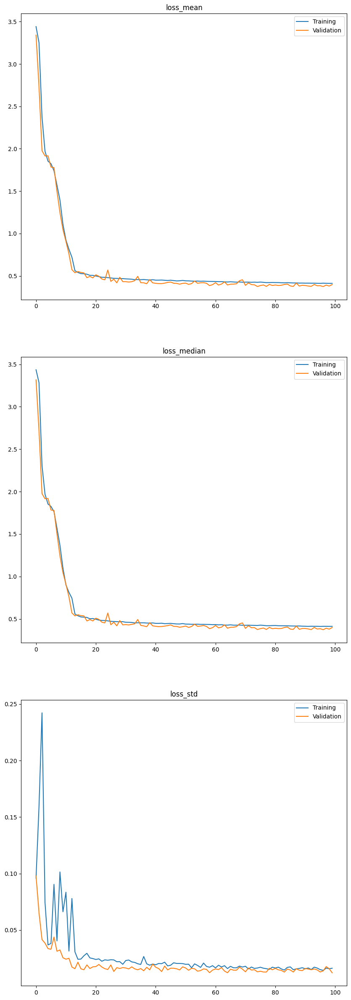

In [ ]:
visualize_training_results(r, loglog = False)

In [30]:
trainer.load_best_model()

In [31]:
model = trainer.model

In [32]:
model.eval()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [33]:
trainer.load_best_model()

In [34]:
trainer.model.cuda()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [35]:
trainer.test()

100%|██████████| 196/196 [01:21<00:00,  2.40it/s]


{'loss_mean': 0.37600985169410706,
 'loss_median': 0.37518638372421265,
 'loss_std': 0.014393063262104988}

In [36]:
N_SAMPLES_PER_MODEL = 1_000

In [52]:
full_model = ModelToPosteriorCNF(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P+1,),
    n_samples=1000,
    batch_size = BATCH_SIZE,
    solve_adjoint = True,
    atol = 1e-5,
    rtol = 1e-5,
    #device = torch.device("cpu")
)
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig_intercept(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0, 'tau_beta0': 3.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)

                dist_beta0 = dist.Normal(0, tau_beta0)

                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                beta_0 = pyro.sample("beta0", dist_beta0)

                mean = mean + beta_0

                with pyro.plate("data", len(x)):
                        y = pyro.sample("ob

In [53]:
trainer.test()

100%|██████████| 196/196 [01:25<00:00,  2.29it/s]


{'loss_mean': 0.3764076232910156,
 'loss_median': 0.3757934272289276,
 'loss_std': 0.015154141932725906}

In [54]:
#?ModelToPosteriorCNF

In [55]:


hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [56]:
str(full_model)

'<PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF.ModelToPosteriorCNF object at 0x7d42a57c9b10>'

In [57]:
#str(analytical_solution)

In [58]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        hmc_sampler,
                        vi_multivariate_normal,
                        vi_diag,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [59]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]
0it [00:00, ?it/s]
Sampling posterior:   1%|          | 1/100 [01:05<1:48:06, 65.52s/it]
0it [00:00, ?it/s]
Sampling posterior:   2%|▏         | 2/100 [02:06<1:42:27, 62.73s/it]
0it [00:00, ?it/s]
Sampling posterior:   3%|▎         | 3/100 [02:59<1:34:41, 58.57s/it]
0it [00:00, ?it/s]
Sampling posterior:   4%|▍         | 4/100 [03:58<1:33:36, 58.50s/it]
0it [00:00, ?it/s]
Sampling posterior:   5%|▌         | 5/100 [05:01<1:35:18, 60.19s/it]
0it [00:00, ?it/s]
Sampling posterior:   6%|▌         | 6/100 [06:04<1:35:53, 61.21s/it]
0it [00:00, ?it/s]
Sampling posterior:   7%|▋         | 7/100 [07:17<1:40:44, 64.99s/it]
0it [00:00, ?it/s]
Sampling posterior:   8%|▊         | 8/100 [08:30<1:43:27, 67.47s/it]
0it [00:00, ?it/s]
Sampling posterior:   9%|▉         | 9/100 [09:19<1:33:28, 61.63s/it]
0it [00:00, ?it/s]
Sampling posterior:  10%|█         | 10/100 [10:03<1:24:16, 56.18s/it]
0it [00:00, ?it/s]
Sampling posterior:  11%|█    

....................


Sampling posterior:   1%|          | 1/100 [00:14<24:02, 14.57s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:29<23:46, 14.56s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:44<24:00, 14.85s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:58<23:36, 14.75s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:13<23:19, 14.73s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:28<23:01, 14.69s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:42<22:43, 14.66s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:57<22:31, 14.69s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:12<22:15, 14.68s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:26<22:00, 14.67s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:41<21:52, 14.75s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:56<21:41, 14.79s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:11<21:28, 14.81s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:26<21:17, 14.85s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:41<20:56, 14.78s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:55<20:38, 14.74s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:10<20:21, 14.72s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:25<20:03, 14.67s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:39<19:51, 14.70s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:54<19:34, 14.68s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:08<19:12, 14.59s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:23<18:58, 14.60s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:38<18:51, 14.69s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:52<18:35, 14.68s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:07<18:15, 14.61s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:22<18:10, 14.74s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:37<17:54, 14.73s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:52<17:49, 14.86s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:07<17:45, 15.00s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:22<17:23, 14.91s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:37<17:10, 14.93s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:52<16:53, 14.91s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:06<16:32, 14.82s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:21<16:25, 14.93s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:36<16:02, 14.81s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:51<15:49, 14.84s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:06<15:35, 14.85s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:21<15:19, 14.83s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:35<15:02, 14.79s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:50<14:50, 14.84s/it]

....................


Sampling posterior:  41%|████      | 41/100 [10:05<14:36, 14.85s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:20<14:21, 14.86s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:35<14:10, 14.92s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:50<13:53, 14.89s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [11:05<13:38, 14.88s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:20<13:29, 14.99s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:35<13:08, 14.87s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:49<12:53, 14.87s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [12:05<12:43, 14.97s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [12:20<12:30, 15.02s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:35<12:17, 15.04s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:50<12:07, 15.15s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [13:05<11:50, 15.13s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [13:21<11:36, 15.14s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:36<11:25, 15.24s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:51<11:05, 15.13s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [14:06<10:47, 15.06s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [14:21<10:35, 15.13s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [14:36<10:18, 15.08s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:51<10:01, 15.03s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [15:07<09:53, 15.21s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [15:22<09:37, 15.19s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [15:37<09:24, 15.26s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:52<09:04, 15.13s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [16:07<08:47, 15.07s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [16:22<08:33, 15.10s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [16:37<08:15, 15.00s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:52<07:57, 14.91s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [17:07<07:43, 14.94s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [17:21<07:27, 14.91s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [17:36<07:13, 14.95s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:52<07:02, 15.07s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [18:07<06:46, 15.05s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [18:22<06:29, 14.98s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [18:37<06:15, 15.00s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [18:52<06:00, 15.01s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [19:07<05:46, 15.07s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [19:22<05:29, 15.00s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [19:37<05:14, 14.98s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [19:52<05:01, 15.08s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [20:07<04:46, 15.07s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [20:22<04:30, 15.03s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [20:37<04:17, 15.15s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [20:52<04:01, 15.09s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [21:07<03:45, 15.03s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [21:23<03:31, 15.13s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [21:38<03:16, 15.10s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [21:53<03:00, 15.06s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [22:08<02:46, 15.12s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [22:23<02:30, 15.02s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [22:37<02:14, 14.96s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [22:53<02:00, 15.03s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [23:08<01:45, 15.05s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [23:22<01:29, 14.93s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [23:38<01:14, 15.00s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [23:53<00:59, 15.00s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [24:08<00:45, 15.03s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [24:23<00:30, 15.07s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [24:37<00:14, 14.91s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<21:30, 13.03s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<21:07, 12.94s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:38<20:51, 12.90s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:51<20:49, 13.02s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:05<20:40, 13.06s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:17<20:21, 13.00s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:31<20:26, 13.18s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:44<20:09, 13.15s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:57<19:55, 13.14s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:11<19:46, 13.18s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:24<19:37, 13.24s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:37<19:22, 13.20s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:50<19:02, 13.14s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:03<18:51, 13.16s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:16<18:39, 13.18s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:29<18:21, 13.11s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:43<18:10, 13.14s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:56<17:52, 13.08s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:09<17:38, 13.06s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:22<17:29, 13.11s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:35<17:10, 13.05s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:47<16:52, 12.98s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:01<16:48, 13.10s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:14<16:28, 13.01s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:27<16:16, 13.01s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:40<16:07, 13.08s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:53<15:50, 13.02s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:06<15:36, 13.01s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:19<15:29, 13.09s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:32<15:12, 13.04s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:45<14:57, 13.00s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:58<14:45, 13.03s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:11<14:31, 13.01s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:24<14:17, 12.99s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:37<14:11, 13.09s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:50<13:53, 13.03s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:03<13:37, 12.98s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:16<13:29, 13.05s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:29<13:15, 13.04s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:42<12:59, 12.99s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:55<12:50, 13.07s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:08<12:35, 13.02s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:21<12:19, 12.97s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:34<12:04, 12.94s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:47<11:54, 13.00s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:00<11:39, 12.95s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:13<11:27, 12.98s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:26<11:19, 13.07s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:39<11:03, 13.01s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:52<10:48, 12.96s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:05<10:37, 13.01s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:18<10:23, 12.99s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:31<10:09, 12.97s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:44<09:59, 13.03s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:57<09:43, 12.97s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:10<09:29, 12.95s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:23<09:19, 13.02s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:36<09:05, 12.98s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:49<08:50, 12.95s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [13:02<08:40, 13.01s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:15<08:25, 12.95s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:28<08:10, 12.92s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:41<08:01, 13.01s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:54<07:46, 12.96s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [14:07<07:32, 12.93s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:20<07:23, 13.03s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:33<07:09, 13.01s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:46<06:56, 13.02s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:59<06:46, 13.11s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [15:12<06:31, 13.05s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:25<06:19, 13.07s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:38<06:04, 13.02s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:51<05:52, 13.07s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [16:04<05:38, 13.01s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:17<05:24, 13.00s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:30<05:13, 13.05s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:43<04:58, 12.99s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:56<04:45, 13.00s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [17:09<04:33, 13.03s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:22<04:19, 12.97s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:35<04:06, 12.99s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:48<03:55, 13.09s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [18:01<03:41, 13.03s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [18:14<03:27, 12.95s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:27<03:15, 13.01s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:40<03:01, 12.99s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:53<02:48, 12.99s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [19:06<02:36, 13.07s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:19<02:23, 13.06s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:32<02:10, 13.03s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:46<01:58, 13.15s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:59<01:44, 13.06s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [20:12<01:31, 13.03s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:25<01:18, 13.11s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:38<01:05, 13.08s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:51<00:52, 13.08s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [21:05<00:39, 13.21s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [21:17<00:26, 13.10s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:30<00:13, 13.05s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:11<19:12, 11.64s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:23<18:52, 11.56s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:34<18:43, 11.58s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:46<18:36, 11.63s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:57<18:18, 11.56s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:09<18:06, 11.56s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:21<18:03, 11.66s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:32<17:48, 11.61s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:44<17:29, 11.53s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:55<17:24, 11.61s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:07<17:11, 11.59s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:18<16:54, 11.53s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:30<16:40, 11.50s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:42<16:38, 11.61s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:53<16:21, 11.54s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:04<16:03, 11.47s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:16<15:58, 11.54s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:27<15:42, 11.49s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:39<15:26, 11.44s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:50<15:14, 11.43s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:02<15:16, 11.60s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:14<15:03, 11.58s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:25<14:53, 11.60s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:37<14:47, 11.68s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:49<14:35, 11.67s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:00<14:20, 11.63s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:12<14:12, 11.68s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:24<13:57, 11.63s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:35<13:43, 11.60s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:47<13:27, 11.54s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:58<13:19, 11.59s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:10<13:05, 11.55s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:21<12:49, 11.48s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:33<12:42, 11.55s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:44<12:28, 11.51s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:56<12:15, 11.49s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:08<12:12, 11.63s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:19<11:58, 11.59s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:31<11:46, 11.58s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:42<11:34, 11.57s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:54<11:27, 11.66s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:06<11:11, 11.58s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:17<11:00, 11.60s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:29<10:53, 11.68s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:40<10:38, 11.60s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:52<10:24, 11.56s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [09:04<10:16, 11.62s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [09:15<10:04, 11.63s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [09:27<09:47, 11.53s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:38<09:36, 11.53s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:50<09:28, 11.61s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [10:02<09:17, 11.62s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [10:13<09:04, 11.59s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [10:25<08:55, 11.64s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:36<08:41, 11.58s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:48<08:27, 11.52s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:59<08:16, 11.55s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [11:11<08:07, 11.60s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [11:23<07:54, 11.58s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [11:34<07:40, 11.52s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:46<07:32, 11.60s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:57<07:19, 11.57s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [12:09<07:06, 11.52s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [12:20<06:56, 11.58s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [12:32<06:42, 11.51s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:43<06:31, 11.50s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:55<06:18, 11.48s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [13:06<06:10, 11.58s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [13:18<05:57, 11.54s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [13:30<05:47, 11.59s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [13:41<05:38, 11.66s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:53<05:24, 11.59s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [14:04<05:12, 11.56s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [14:16<05:04, 11.69s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [14:28<04:51, 11.66s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [14:39<04:39, 11.64s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:51<04:26, 11.61s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [15:03<04:16, 11.64s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [15:14<04:03, 11.57s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [15:26<03:51, 11.56s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [15:37<03:40, 11.59s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [15:49<03:28, 11.58s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [16:00<03:16, 11.54s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [16:12<03:05, 11.62s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [16:24<02:54, 11.62s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [16:35<02:42, 11.57s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [16:47<02:29, 11.54s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:59<02:19, 11.63s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [17:10<02:07, 11.62s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [17:22<01:56, 11.65s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [17:34<01:45, 11.76s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [17:45<01:33, 11.72s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [17:57<01:21, 11.68s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [18:09<01:09, 11.61s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [18:20<00:58, 11.66s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [18:32<00:46, 11.65s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [18:43<00:34, 11.61s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [18:55<00:23, 11.68s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [19:07<00:11, 11.65s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<27:25, 16.62s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:32<26:50, 16.44s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:49<26:41, 16.51s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:05<26:14, 16.40s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:22<25:57, 16.40s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:39<25:59, 16.59s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:55<25:41, 16.58s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:12<25:31, 16.65s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:28<25:07, 16.57s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:45<24:59, 16.67s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:02<24:38, 16.62s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:19<24:28, 16.68s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:35<24:14, 16.72s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:52<23:57, 16.72s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:09<23:45, 16.77s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:25<23:21, 16.68s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:42<23:09, 16.74s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:59<22:49, 16.70s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:16<22:30, 16.68s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:33<22:24, 16.81s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:50<22:13, 16.88s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:07<22:00, 16.93s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:24<21:38, 16.86s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:40<21:17, 16.82s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:57<20:57, 16.77s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:14<20:38, 16.74s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:30<20:15, 16.66s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:46<19:53, 16.57s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [08:03<19:40, 16.62s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:20<19:23, 16.63s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:37<19:10, 16.68s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:53<18:45, 16.56s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:10<18:32, 16.60s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:26<18:15, 16.59s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:43<17:57, 16.58s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:59<17:40, 16.57s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:16<17:21, 16.53s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:32<17:09, 16.61s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:49<16:46, 16.50s/it]

....................


Sampling posterior:  40%|████      | 40/100 [11:05<16:29, 16.50s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:21<16:09, 16.44s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:38<15:57, 16.51s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:54<15:38, 16.46s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:11<15:25, 16.53s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:28<15:06, 16.48s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:44<14:48, 16.45s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [13:00<14:33, 16.48s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:17<14:16, 16.46s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:34<14:04, 16.55s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:50<13:44, 16.50s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [14:07<13:32, 16.57s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:23<13:12, 16.50s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:39<12:52, 16.45s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:56<12:39, 16.51s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:12<12:20, 16.45s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:29<12:06, 16.51s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:45<11:49, 16.49s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [16:02<11:33, 16.52s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:18<11:15, 16.47s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:35<10:56, 16.42s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:51<10:42, 16.47s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:08<10:23, 16.41s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:24<10:10, 16.51s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:41<09:54, 16.50s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:58<09:39, 16.57s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:14<09:23, 16.56s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:30<09:04, 16.49s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:47<08:52, 16.64s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [19:04<08:32, 16.55s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:20<08:17, 16.58s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:37<08:00, 16.57s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:54<07:47, 16.70s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:10<07:28, 16.62s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:27<07:10, 16.55s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:44<06:55, 16.61s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [21:00<06:36, 16.51s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:17<06:21, 16.58s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:33<06:02, 16.49s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:49<05:47, 16.54s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [22:06<05:29, 16.49s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:22<05:12, 16.45s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:39<04:57, 16.51s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:55<04:40, 16.49s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:12<04:23, 16.50s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:28<04:07, 16.48s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:45<03:51, 16.57s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [24:01<03:34, 16.47s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:17<03:16, 16.37s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:34<03:01, 16.47s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:51<02:44, 16.47s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [25:07<02:29, 16.56s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [25:24<02:12, 16.53s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:41<01:56, 16.63s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:57<01:39, 16.54s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:13<01:22, 16.51s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:30<01:06, 16.56s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:47<00:49, 16.54s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [27:03<00:33, 16.57s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [27:20<00:16, 16.50s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:24<40:04, 24.29s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:48<39:58, 24.47s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [01:13<39:44, 24.58s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:38<39:18, 24.57s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [02:02<38:55, 24.58s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [02:27<38:37, 24.65s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [02:52<38:16, 24.70s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [03:16<37:46, 24.64s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [03:41<37:22, 24.64s/it]

....................


Sampling posterior:  10%|█         | 10/100 [04:06<37:14, 24.83s/it]

....................


Sampling posterior:  11%|█         | 11/100 [04:31<36:53, 24.87s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [04:56<36:28, 24.87s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [05:21<36:09, 24.94s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [05:46<35:29, 24.76s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [06:10<34:58, 24.69s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [06:35<34:29, 24.64s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [06:59<33:52, 24.48s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [07:23<33:35, 24.58s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [07:48<33:21, 24.70s/it]

....................


Sampling posterior:  20%|██        | 20/100 [08:13<32:59, 24.74s/it]

....................


Sampling posterior:  21%|██        | 21/100 [08:38<32:30, 24.68s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [09:03<32:08, 24.72s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [09:27<31:42, 24.71s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [09:52<31:21, 24.76s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [10:17<30:52, 24.70s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [10:41<30:21, 24.61s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [11:06<29:49, 24.52s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [11:30<29:24, 24.51s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [11:54<28:47, 24.33s/it]

....................


Sampling posterior:  30%|███       | 30/100 [12:18<28:27, 24.40s/it]

....................


Sampling posterior:  31%|███       | 31/100 [12:43<28:04, 24.41s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [13:07<27:38, 24.40s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [13:32<27:17, 24.43s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [13:56<26:53, 24.45s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [14:21<26:27, 24.42s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [14:46<26:15, 24.61s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [15:10<25:54, 24.67s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [15:35<25:29, 24.68s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [16:00<25:05, 24.68s/it]

....................


Sampling posterior:  40%|████      | 40/100 [16:24<24:37, 24.63s/it]

....................


Sampling posterior:  41%|████      | 41/100 [16:49<24:09, 24.56s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [17:13<23:37, 24.44s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [17:38<23:15, 24.49s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [18:02<22:50, 24.48s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [18:27<22:35, 24.65s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [18:51<21:57, 24.41s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [19:15<21:35, 24.45s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [19:41<21:21, 24.65s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [20:05<20:53, 24.58s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [20:30<20:29, 24.58s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [20:54<20:00, 24.49s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [21:18<19:30, 24.39s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [21:42<18:58, 24.22s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [22:06<18:33, 24.21s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [22:30<18:12, 24.27s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [22:54<17:44, 24.18s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [23:19<17:20, 24.19s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [23:43<16:58, 24.24s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [24:07<16:33, 24.24s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [24:31<16:04, 24.11s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [24:55<15:43, 24.19s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [25:20<15:20, 24.24s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [25:45<15:03, 24.42s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [26:10<14:49, 24.71s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [26:35<14:30, 24.88s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [27:00<14:07, 24.94s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [27:26<13:48, 25.10s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [27:51<13:26, 25.20s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [28:17<13:02, 25.23s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [28:42<12:37, 25.26s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [29:07<12:12, 25.25s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [29:33<11:48, 25.31s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [29:58<11:25, 25.38s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [30:23<10:56, 25.24s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [30:48<10:32, 25.32s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [31:14<10:08, 25.34s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [31:39<09:40, 25.24s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [32:04<09:16, 25.28s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [32:30<08:51, 25.32s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [32:55<08:24, 25.23s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [33:20<08:00, 25.28s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [33:45<07:35, 25.31s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [34:11<07:11, 25.36s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [34:36<06:44, 25.27s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [35:01<06:19, 25.27s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [35:27<05:54, 25.30s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [35:52<05:28, 25.30s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [36:17<05:02, 25.24s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [36:42<04:38, 25.30s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [37:08<04:13, 25.33s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [37:33<03:47, 25.23s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [37:58<03:22, 25.30s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [38:24<02:57, 25.34s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [38:49<02:32, 25.36s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [39:15<02:07, 25.53s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [39:40<01:41, 25.46s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [40:06<01:16, 25.41s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [40:31<00:50, 25.43s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [40:57<00:25, 25.40s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 659.09it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [04:55<00:00,  2.96s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,<PFNExperiments.LinearRegression.Models.ModelT...,gt,12.410388,0.089753,0.52735,1.251356,0.190821,0.190183,0.007703,0.000164,0.027929,2.776073,0.103494,0.100730
1,Hamiltonian Monte Carlo,gt,12.406545,0.089802,0.52825,1.830814,0.189770,0.186679,0.008624,0.000196,0.028845,2.980004,0.104452,0.098292
2,Variational Inference with guide: AutoMultivar...,gt,12.447378,0.090480,0.52430,-193.982352,0.565438,0.560546,0.009699,0.000219,0.028639,1680.444118,0.653169,0.647500
3,Variational Inference with guide: AutoDiagonal...,gt,12.433313,0.090414,0.52635,-282.647914,0.573579,0.577036,0.004933,0.000124,0.031453,748.232913,0.650844,0.653966
4,Variational Inference with guide: AutoLaplaceA...,gt,12.437508,0.090305,0.52870,NaN,NaN,0.574221,0.000000,0.000000,0.031242,NaN,NaN,0.671587
5,Variational Inference with guide: AutoIAFNorma...,gt,12.350178,0.088882,0.52365,-16.630559,0.484648,0.477286,0.007592,0.000187,0.030483,62.422927,0.419836,0.412118
6,Variational Inference with guide: AutoStructur...,gt,12.457899,0.090374,0.53005,-12.475429,0.569202,0.566007,0.012865,0.000274,0.027784,66.919699,0.671222,0.668729


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,1.385561e-03,8.779798e-02,0.789627,7.683177e-05,4.535229e-01,1.439364e-01
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896340e-18,0.373676,2.283033e-07,5.856625e-07,5.345133e-08
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,4.266323e-18,3.896560e-18,0.774694,1.255922e-17,1.307236e-07,1.549014e-08
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.896340e-18,0.591336,NaN,NaN,1.671253e-06
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.896120e-18,0.341072,2.802531e-10,4.059304e-12,1.637463e-12
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,3.896560e-18,4.397114e-18,0.396437,1.301838e-05,4.759741e-08,2.399644e-08
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,3.896560e-18,3.896340e-18,0.252920,3.961741e-12,2.283033e-07,4.470203e-09
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,5.268910e-18,0.986671,9.893009e-18,4.155136e-08,1.974672e-09
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,4.531606e-18,0.742497,NaN,NaN,4.397351e-07
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,3.895681e-18,0.159447,6.635259e-15,1.482973e-12,4.020614e-13



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,0.264308,0.097335,0.631055,0.105310,0.105709,0.074715
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,1.395579,1.699302,0.771505,1.868062,2.331056,0.166426
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,1.499796,2.565487,0.938475,1.840360,2.389034,0.048869
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,1.620756,3.667604,0.999985,1.838273,2.160142,0.000086
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,1.282267,1.865030,0.847065,1.248376,1.975464,0.133050
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,1.411459,1.591470,0.769500,1.935989,2.171397,0.162086
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,1.383890,1.684845,0.730680,1.885035,2.391198,0.196072
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,1.494645,2.524706,0.932850,1.853754,2.474256,0.051944
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,1.620706,3.657887,1.000000,1.848659,2.226314,0.000000
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,1.261188,1.835143,0.827885,1.264279,2.026316,0.152688


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,7.795866e-08,1.189394e-12,2.363938e-10
1,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,6.376032e-22,5.420133e-34,4.472487e-33
2,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,5.109723e-30,2.562144e-34,1.621033e-38
3,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,1.425408e-21,7.747265e-27,7.761112e-25
4,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,8.519407e-09,8.754983e-14,5.605020e-11
...,...,...,...,...,...,...,...
100,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,3.257513e-07,4.872791e-33,5.628418e-39
101,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,1.623532e-04,2.806964e-01,1.564230e-01
102,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,3.342797e-07,5.731973e-20,3.221741e-01
103,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,5.487812e-03,4.194175e-16,6.877253e-36


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0  <PFNExperiments.LinearRegression.Models.ModelT...  gt   
  1                            Hamiltonian Monte Carlo  gt   
  2  Variational Inference with guide: AutoMultivar...  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          12.410388            0.089753   
  1                                          12.406545            0.089802   
  2                                          12.447378            0.090480   
  3                                          12.433313            0.090414   
  4                                          12.437508            0.0

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

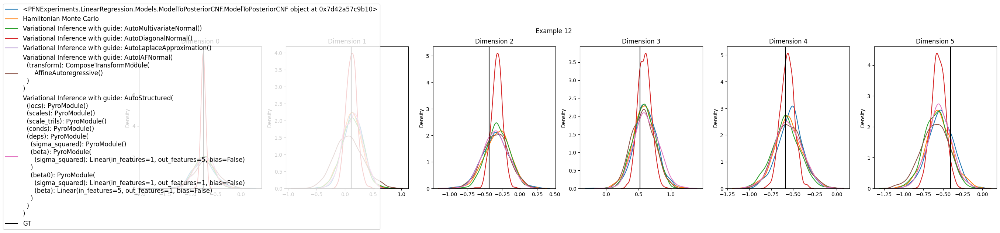

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

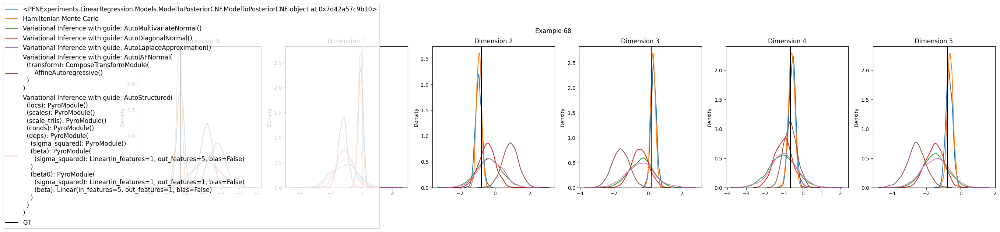

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

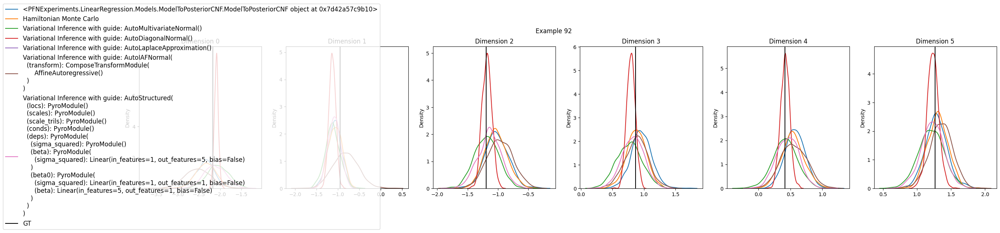

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

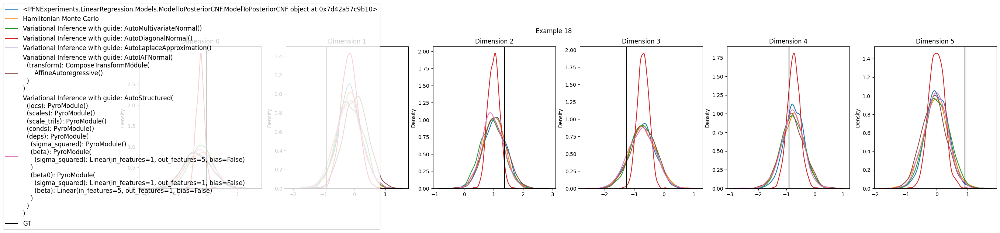

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

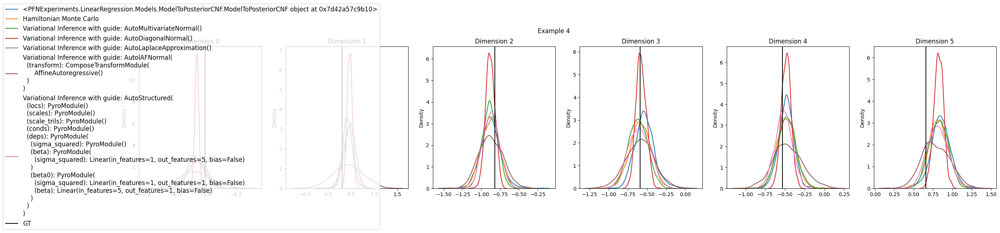

In [60]:
evaluation.plot_results()